In [185]:
import pygmt 
from numpy.random import randint
import xarray as xr
import numpy as np
import getpass
import pandas as pd


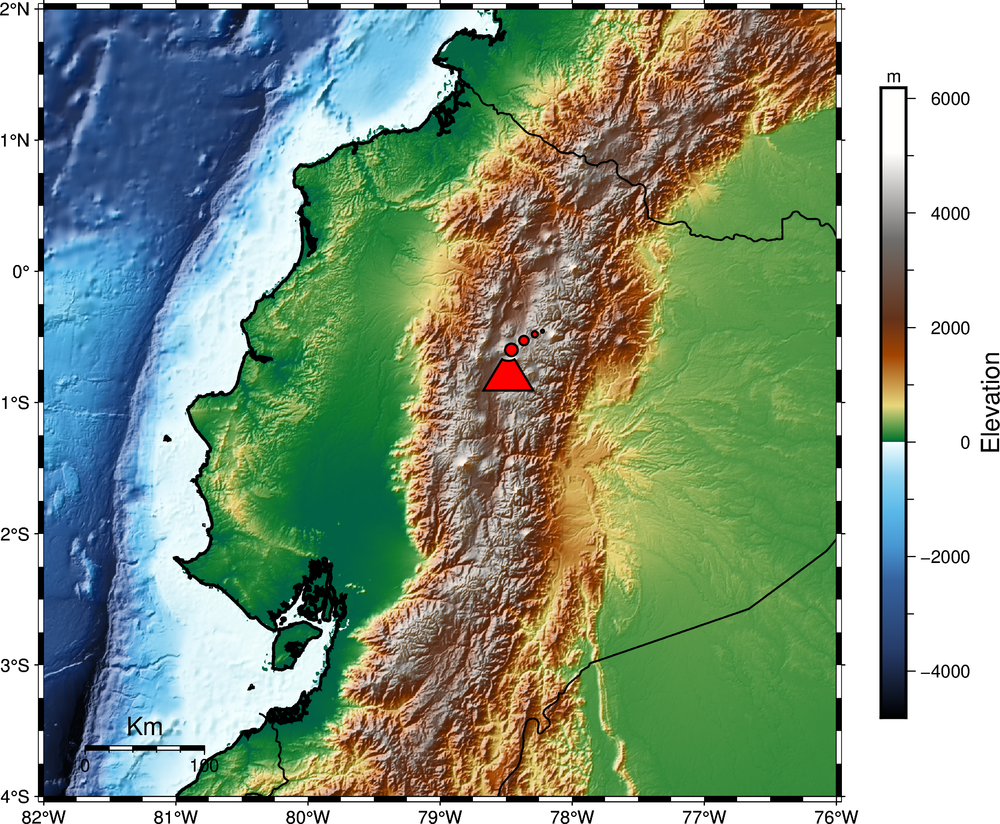

In [186]:
fig = pygmt.Figure()
region=[-82,-76,-4,2]
fig.grdimage(
    grid= "@earth_relief_15s",      #ZOOM IN AND ADD THE REST OF THE VOLCANOES. 
    cmap='geo',
    region=region,
    projection='M6i',
    shading=True,
    frame=True,   
)

fig.coast(
    region=region,                #[xmin, xmax, ymin, ymax]
    projection='M6i',           # 4 inches mercator projection     #'a0.2i' star symbol
    shorelines="1.5p,black",
    borders=["1/0.9p,black"],
    map_scale="jBL+w100k+f+o0.8c/0.8c+lKm",
#    water='lightblue',
#    land='grey',
    frame=True,
) 
#fig.text(text=["Nazca Plate", "Colombia", "Peru", "Ecuador"], x=[-83, -75, -78, -76], 
#         y=[1, 1, -5, -1], font="10p,Helvetica-Bold,black") 
#POINT_FILL = 'Cotopaxi'
#fig.plot(
#    x=-78.436,
#    y=-0.67,
#    style='volcano',    #'t0.2i',
#    color='red',
#    pen='black',
#    label=f'{POINT_FILL}',
#)  
fig.plot(x=-78.436, y=-0.67, style="kvolcano/1.2c", pen="1p,black", color="red")
#fig.text(x=-78.436, y=0, text="Cotopaxi", font="10p,Helvetica-Bold")
fig.colorbar(position="JMR", cmap=True, frame=["af", "x+lElevation", "y+lm"])   #"+Uk"

fig.show() 

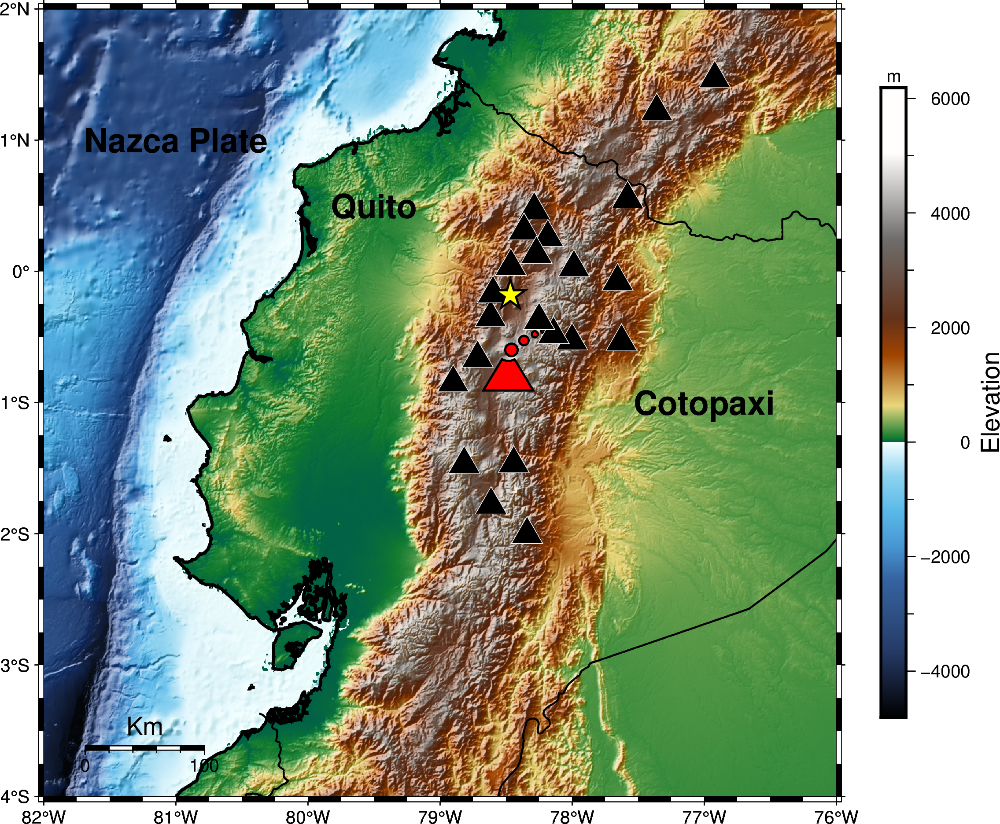

In [187]:
EcVolc = pd.read_csv (r'/Users/seismo_reynier/Documents/Ecuado_volc.csv') 
fig.plot(
    x=EcVolc.Longitude,
    y=EcVolc.Latitude,
    style="t0.7c",
    pen="0.2p,white", 
    color='black',   
    #label="Central America Volcanoes",
    #cmap=True,
)
fig.plot(x=-78.4676, y=-0.1807, style="a0.6c", pen="1p,black", color="yellow", label='Quito')
#fig.legend(position="jTL", box="+p2p,black")
fig.text(x=-79.5, y=0.5, text="Quito", font="18p,Helvetica-Bold")
fig.text(x=-81, y=1, text="Nazca Plate", font="18p,Helvetica-Bold")
fig.text(x=-77, y=-1, text="Cotopaxi", font="18p,Helvetica-Bold")
fig.show()

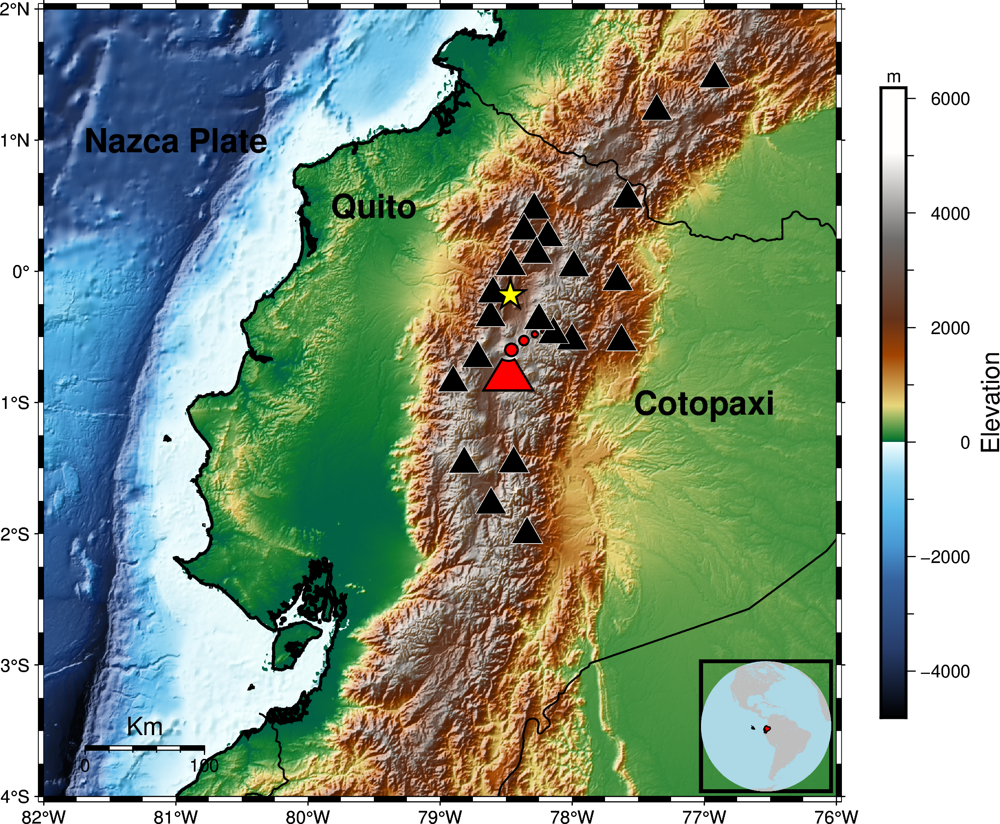

In [188]:
# Create an inset, setting the position to top left, the width to 3.5 cm, and
# the x- and y-offsets to 0.2 cm. The margin is set to 0, and the border is
# "gold" with a pen size of 1.5p.
with fig.inset(position="jBR+w2.5c+o0.1c", margin=0, box="+p2p,black"):
    # Create a figure in the inset using coast. This example uses the azimuthal
    # orthogonal projection centered at 47E, 20S. The land color is set to
    # "gray" and Madagascar is highlighted in "red3".
    fig.coast(
        region="g",
        projection='G-79/1/2.5c',
        land="gray",
        water="lightblue",
        dcw="EC+gred+p0.5p",
    )
fig.show() 
fig.savefig(r'/Users/seismo_reynier/Documents/Cotopaxi.png', dpi = 300) 

grdblend [NOTICE]: Remote data courtesy of GMT data server oceania [http://oceania.generic-mapping-tools.org]
grdblend [NOTICE]: SRTM15 Earth Relief at 02x02 arc minutes reduced by Gaussian Cartesian filtering (3.8 km fullwidth) [Tozer et al., 2019].
grdblend [NOTICE]:   -> Download 60x60 degree grid tile (earth_relief_02m_p): S30W120
grdcontour [WARNING]: Annotation interval is not a multiple of contour interval - no annotated contours will be drawn.
grdcontour [WARNING]: Annotation interval is not a multiple of contour interval - no annotated contours will be drawn.


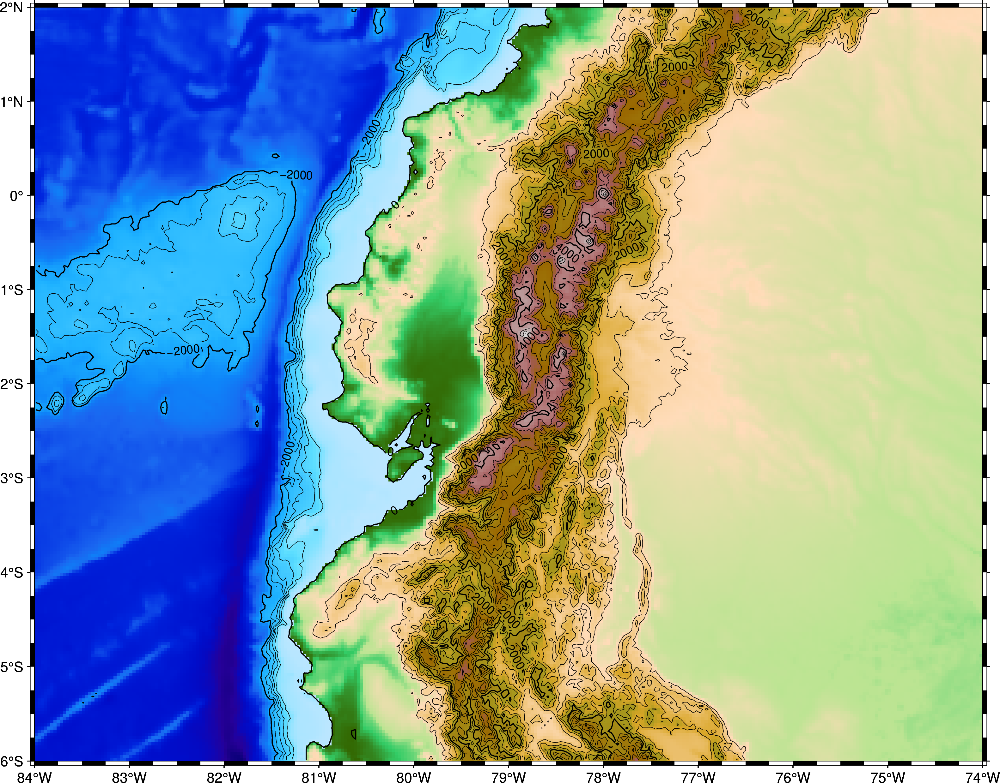

In [61]:
grid = pygmt.datasets.load_earth_relief(resolution="02m", region=region)
fig = pygmt.Figure()
fig.grdcontour(grid=grid)
fig = pygmt.Figure()
fig.grdcontour(
    annotation=1000,
    interval=400,
    grid=grid,
    limit=[-2000, 8000],
    projection="M10i",
    frame=True,
)
fig.grdimage(
    grid=grid,
    cmap="etopo1",
    projection="M10i",
    frame=True,
)
fig.grdcontour(
    annotation=1000,
    interval=400,
    grid=grid,
    limit=[-2000, 8000],
)
fig.show() 